# Differential forms

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import seaborn as sns
import numpy as np
from matplotlib import animation
import math
from datetime import date, datetime
from tqdm.notebook import tqdm
import os
np.set_printoptions(suppress=True)

In [2]:
today = date.today().strftime("%d-%m-%y")
os.makedirs('imgs', exist_ok=True)
os.makedirs('imgs/%s' % today, exist_ok=True)

In [3]:
def timeline(tmax,dt,tmin=0):
    """ 
    Create timeline
    
    Parameters
    tmax: maximum time  
    
    dt: time interval
    """
    t = np.arange(tmin,tmax,dt)
    print('# of iterations: ' + str(t.shape[0]))
    return t

def cicloide(curva,r,d):
    if d==0: 
        x=r*(t-np.sin(t))
        y=r*(1-np.cos(t))
    else:
        x= r*t-d*np.sin(t)
        y= r-d*np.cos(t)
    return (curva[:][0],x,y)

def spirografo(curva,R): #migliorare per avere come input una curva (in particolare una curva spirografo per farne infiniti uno dentro l'altro)
    rho = R - curva[:][2]        # l1+l2>d_max + (r1+r2)
    theta= curva[:][0] + curva[:][1]
    (x_cart,y_cart) = pol2cart(rho,theta)
    return (t, x_cart, y_cart)

def liss(tmax,dt,Tx,Ty,phase):
    t = timeline(tmax,dt)
    x = np.cos(2*np.pi/Tx * t)#*np.sin(-t)
    y = np.sin(2*np.pi/Ty * t+phase)#*np.exp(-t)
    plt.figure(figsize=(8,8))
    plt.plot(x,y,c=np.random.rand(3,))
    plt.axis('off')
    return t, x, y

In [4]:
def pol2cart(rho, theta):
    x = rho * np.cos(theta)
    y = rho * np.sin(theta)
    return(x, y)

def rotate(x, y, time, x_rot, y_rot, Tfoglio, save = False, bc="w", axe = 'off', cc = np.random.rand(3,), lw = 0.8):
    """
    Rotate curve

    x: 1st column of np.array
    y: 2nd column of np.array
    x_rot: center of rotation x coord
    y_rot: center of rotation y coord
    Tfoglio: Period of sheet's rotation
    save: default == False, if True save fig
    bc: background color k means black, w means white
    axe: off= disable axis
    cc: curve color (default: random)
    """

    omega=2*np.pi/Tfoglio
    print("line color:{}".format(cc))
    qx = x_rot + np.cos(omega*time) * (x - x_rot) - np.sin(omega*time) * (y - y_rot)
    qy = y_rot + np.sin(omega*time) * (x - x_rot) + np.cos(omega*time) * (y - y_rot)
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
    axes[0].plot(x, y, c = cc, lw = lw)
    axes[1].plot(qx, qy, c = cc, lw = lw)
    axes[0].axis(axe)
    axes[1].axis(axe)
    axes[0].title.set_text('Original curve')
    axes[1].title.set_text('Rotated one')
    axes[1].set_facecolor(bc)
    axes[1].add_artist(axes[1].patch)
    axes[1].patch.set_zorder(-1)
    axes[0].set_facecolor(bc)
    axes[0].add_artist(axes[0].patch)
    axes[0].patch.set_zorder(-1)
    fig.tight_layout()
    
    if save==True:      
        #rotato
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(qx , qy, c = cc, lw = lw)
        #ax.plot(s[:,0],s[:,1],"-", c=np.random.rand(3,),lw=0.8)
        ax.axis("off")
        ax.set_facecolor(bc)
        ax.add_artist(ax.patch)
        ax.patch.set_zorder(-1)
        plt.tight_layout()
        plt.margins(0,0)
        plt.savefig("imgs/{}/xrot{}_yrot{}_T{}_{}.jpg".format(today,x_rot, y_rot, Tfoglio, datetime.now().strftime("%H-%M-%S")),dpi=300)
        plt.savefig("imgs/{}/xrot{}_yrot{}_T{}_{}.pdf".format(today,x_rot, y_rot, Tfoglio, datetime.now().strftime("%H-%M-%S")))
        plt.close()
        
        #orignal
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(x,y,c=cc,lw = lw)
        #ax.plot(s[:,0],s[:,1],"-", c=np.random.rand(3,),lw=0.8)
        ax.axis("off")
        ax.set_facecolor(bc)
        ax.add_artist(ax.patch)
        ax.patch.set_zorder(-1)
        plt.tight_layout()
        plt.margins(0,0)
        plt.savefig("imgs/{}/xrot{}_yrot{}_T{}_o_{}.jpg".format(today,x_rot, y_rot, Tfoglio, datetime.now().strftime("%H-%M-%S")),dpi=300)
        plt.savefig("imgs/{}/xrot{}_yrot{}_T{}_o_{}.pdf".format(today,x_rot, y_rot, Tfoglio, datetime.now().strftime("%H-%M-%S")))
        plt.close()

    return qx, qy

def translate(x, y, time, vx, vy, save=False, bc = "w", axe = 'off', cc = np.random.rand(3,) , lw = 0.8):
    qx = x + vx*time
    qy = y + vy*time
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
    axes[0].plot(x, y, c = cc, lw = lw)
    axes[1].plot(qx, qy, c = cc, lw = lw)
    axes[0].axis(axe)
    axes[1].axis(axe)
    axes[0].title.set_text('Original curve')
    axes[1].title.set_text('Translated one')
    axes[1].set_facecolor(bc)
    axes[1].add_artist(axes[1].patch)
    axes[1].patch.set_zorder(-1)
    axes[0].set_facecolor(bc)
    axes[0].add_artist(axes[0].patch)
    axes[0].patch.set_zorder(-1)
    fig.tight_layout()
    
    if save==True:      
        #rotato
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(qx , qy, c = cc, lw = lw)
        ax.axis("off")
        ax.set_facecolor(bc)
        ax.add_artist(ax.patch)
        ax.patch.set_zorder(-1)
        plt.tight_layout()
        plt.margins(0,0)
        plt.savefig("imgs/{}/vx{}_vy{}_{}.jpg".format(today,vx, vy, datetime.now().strftime("%H-%M-%S")),dpi=300)
        plt.savefig("imgs/{}/vx{}_vy{}_{}.pdf".format(today,vx, vy, datetime.now().strftime("%H-%M-%S")))
        plt.close()
        
        #orignal
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(1, 1, 1)
        ax.plot(x,y,c=cc,lw=lw)
        ax.axis("off")
        ax.set_facecolor(bc)
        ax.add_artist(ax.patch)
        ax.patch.set_zorder(-1)
        plt.tight_layout()
        plt.margins(0,0)
        plt.savefig("imgs/{}/vx{}_vy{}_o_{}.jpg".format(today,vx, vy, datetime.now().strftime("%H-%M-%S")),dpi=300)
        plt.savefig("imgs/{}/vx{}_vy{}_o_{}.pdf".format(today,vx, vy, datetime.now().strftime("%H-%M-%S")))
        plt.close()

    return qx, qy


def polate(x, y, qx, qy, save = False, bc = "w", lw = 0.8, cc = np.random.rand(3,), axe = 'off'):
    fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 10), subplot_kw = dict(polar = True))
    axes[0].plot(x, y, c = cc, linewidth = lw)
    axes[1].plot(qx, qy, c = cc, linewidth = lw)
    axes[0].axis(axe)
    axes[1].axis(axe)
    axes[0].title.set_text('Original but polata')
    axes[1].title.set_text('Rotated one polata (+ o -)')
    axes[1].set_facecolor(bc)
    axes[1].add_artist(axes[1].patch)
    axes[1].patch.set_zorder(-1)
    axes[0].set_facecolor(bc)
    axes[0].add_artist(axes[0].patch)
    axes[0].patch.set_zorder(-1)
    fig.tight_layout()
    
    if save==True:      
        #rotato
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(1, 1, 1, projection='polar')
        ax.plot(qx , qy, c = cc, lw = lw)
        ax.axis("off")
        ax.set_facecolor(bc)
        ax.add_artist(ax.patch)
        ax.patch.set_zorder(-1)
        plt.tight_layout()
        plt.margins(0,0)
        plt.savefig("imgs/{}/polata_o_{}.jpg".format(today,datetime.now().strftime("%H-%M-%S")),dpi=300)
        plt.savefig("imgs/{}/polata_o_{}.pdf".format(today,datetime.now().strftime("%H-%M-%S")))
        plt.close()
        
        #orignal
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(1, 1, 1,projection='polar')
        ax.plot(x, y, c = cc, lw = lw)
        ax.axis("off")
        ax.set_facecolor(bc)
        ax.add_artist(ax.patch)
        ax.patch.set_zorder(-1)
        plt.tight_layout()
        plt.margins(0,0)
        plt.savefig("imgs/{}/polata_rot_{}.jpg".format(today,datetime.now().strftime("%H-%M-%S")),dpi=300)
        plt.savefig("imgs/{}/polata_rot_{}.pdf".format(today,datetime.now().strftime("%H-%M-%S")))
        plt.close()

    return

def plot_palette(P, t, cmap = "cubehelix", lw = 0.8, save = False, bc = "w", axe = "off"):
    points = np.array([P[:,0],P[:,1]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    fig, axs = plt.subplots(1, 1, figsize=(12,12))
    plt.axis(axe)
    norm = plt.Normalize(t.min(), t.max())
    lc = LineCollection(segments, cmap = cmap, norm = norm)
    lc.set_array(t)
    lc.set_linewidth(lw)
    line = axs.add_collection(lc)

    #fig.tight_layout()
    axs.set_facecolor(bc)
    axs.add_artist(axs.patch)
    axs.patch.set_zorder(-1)
    axs.set_xlim(P[:,0].min(), P[:,0].max())
    axs.set_ylim(P[:,1].min(), P[:,1].max())
    plt.margins(0,0)
    plt.show()
    if save == True:
        fig.savefig('imgs/{}/fullpalettato_{}.jpg'.format(today,datetime.now().strftime("%H-%M-%S")),dpi=300)
        #fig.savefig('imgs/{}/fullpalettato_{}.pdf'.format(today,datetime.now().strftime("%H-%M-%S")))
    
    return

## Lissajous

# of iterations: 10000


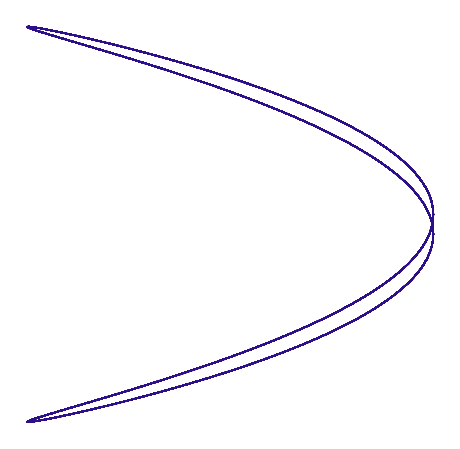

In [5]:
t, x, y = liss(tmax = 100, dt = 0.01, Tx = 1, Ty = 2, phase = 0.05)

line color:k


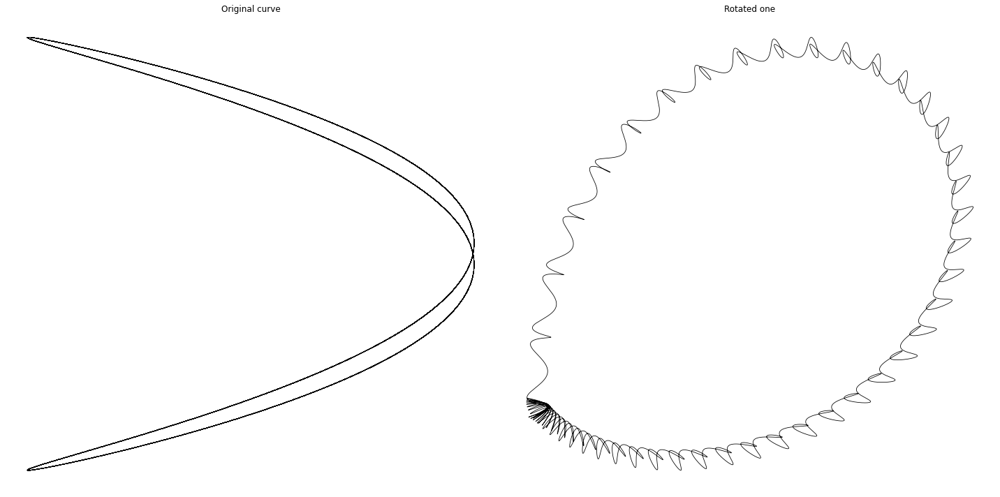

In [6]:
qx,qy = rotate(x, y, t, x_rot = 0.5-t/50 + t*t/150, y_rot = 0.5, Tfoglio = 100, save = False, bc = "w", cc = "k")

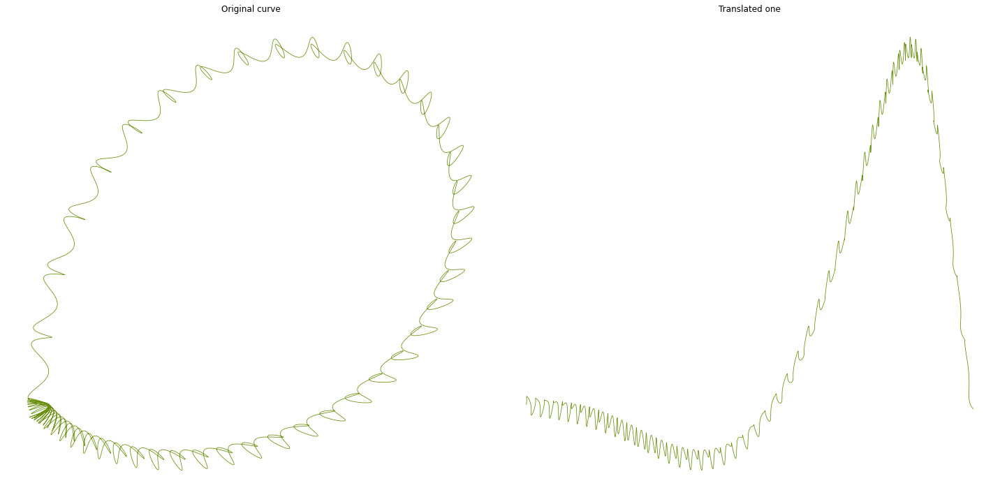

In [7]:
rx, ry = translate(qx, qy, t, vx = 5, vy = -0.005, save = True, bc = "w", cc = np.random.rand(3,))

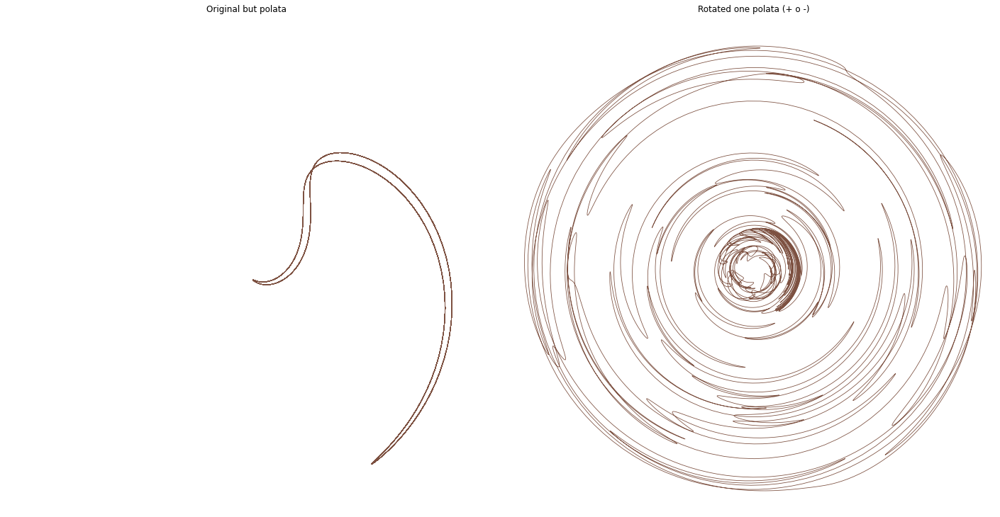

In [8]:
polate(x = x, y = y, qx = qx, qy = qy, save=False)

## Fasori

In [6]:
def phasor(t, x, y, r, T, phase):
    if isinstance(r, (int, float)):
        r1 = r*np.ones_like(t)
    else:
        r1 = r
        #r1 = r(t)/tmax
    pointx = x + r1 * np.cos((2*np.pi/T)*t+phase)
    pointy = y + r1 * np.sin((2*np.pi/T)*t+phase)
    
    return np.vstack((pointx,pointy)).T

def upper_intersection(x0, y0, r0, x1, y1, r1):
    """
    # circle 1: (x0, y0), radius r0
    # circle 2: (x1, y1), radius r1
    """
    
    d = math.sqrt((x1-x0)**2 + (y1-y0)**2)
    # non intersecting
    if d > r0 + r1 :
        return np.nan,np.nan
    # One circle within other
    if d < abs(r0-r1):
        return np.nan,np.nan
    # coincident circles
    if d == 0 and r0 == r1:
        return np.nan,np.nan
    else:
        a=(r0**2-r1**2+d**2)/(2*d)
        h=math.sqrt(r0**2-a**2)
        x2=x0+a*(x1-x0)/d  
        y2=y0+a*(y1-y0)/d  
        x3=x2+h*(y1-y0)/d    
        y3=y2-h*(x1-x0)/d

        x4=x2-h*(y1-y0)/d
        y4=y2+h*(x1-x0)/d
    
        
        if y3>=y4:           # selezione soluzione
            [x,y]=[x3, y3]
        else:
            [x,y]=[x4, y4]
        
        return x, y
        #return ([x3, y3], [x4, y4])

def intersection(x0, y0, r0, x1, y1, r1, choice):
    """
    # circle 1: (x0, y0), radius r0
    # circle 2: (x1, y1), radius r1
    """
    
    d = math.sqrt((x1-x0)**2 + (y1-y0)**2)
    # non intersecting
    if d > r0 + r1 :
        return np.nan,np.nan
    # One circle within other
    if d < abs(r0-r1):
        return np.nan,np.nan
    # coincident circles
    if d == 0 and r0 == r1:
        return np.nan,np.nan
    else:
        a=(r0**2-r1**2+d**2)/(2*d)
        h=math.sqrt(r0**2-a**2)
        x2=x0+a*(x1-x0)/d  
        y2=y0+a*(y1-y0)/d  
        x3=x2+h*(y1-y0)/d    
        y3=y2-h*(x1-x0)/d

        x4=x2-h*(y1-y0)/d
        y4=y2+h*(x1-x0)/d
    
        if choice == "up":
            if y3>=y4:           # selezione soluzione
                [x,y]=[x3, y3]
            else:
                [x,y]=[x4, y4]
        elif choice == "down":
            if y3<=y4:           # selezione soluzione
                [x,y]=[x3, y3]
            else:
                [x,y]=[x4, y4]
        
        return x, y
    
def lineFromPoints(P, Q):
    a = Q[1] - P[1]
    b = Q[0] - P[0]
 
    m = a/b
    q = (Q[0]*P[1]-P[0]*Q[1])/b 
    return m, q      
    
def solution(Px, Py, l1, Qx, Qy ,l2, u = 0, choice = "up"):
    sol = []
    for i in range (len(Px)):
        """p1, p2 = upper_intersection(Px[i],Py[i], l1 ,Qx[i], Qy[i], l2)
        
        m, q = lineFromPoints([Px[i],Py[i]],[Qx[i],Qy[i]])
        if p1[1] >= m * p1[0] + q:
            alpha = np.arctan(m)
            if alpha > 0:
                sol.append([p1[0] + np.cos(alpha), p1[1] + np.sin(alpha)])
            else:
                sol.append([p1[0] - np.cos(alpha), p1[1] - np.sin(alpha)])
        else:
            sol.append(p2)"""
        
        #x,y = upper_intersection(Px[i],Py[i], l1 ,Qx[i], Qy[i], l2)
        x,y = intersection(Px[i],Py[i], l1 ,Qx[i], Qy[i], l2, choice)
        sol.append([x,y])
        if u>0:
            m, q = lineFromPoints([Px[i],Py[i]],sol[i])
            alpha = np.arctan(m)
            if alpha > 0:
                sol[i][0] = sol[i][0] + u*np.cos(alpha)
                sol[i][1] = sol[i][1] + u*np.sin(alpha)
            else:
                sol[i][0] = sol[i][0] - u*np.cos(alpha)
                sol[i][1] = sol[i][1] - u*np.sin(alpha)
    return np.asarray(sol)

def linecircle(x,y,r,m,q, choice):
    a = -2*x
    b = -2*y
    c = a**2 /4 + b**2 /4 - r**2
    a1 = 1+m**2
    b1 = 2*m*q + a + b*m
    c1 = q**2 + b*q +c
    delta = b1**2 -4*a1*c1
    if delta >0:
        if choice == "1":
            x1 = (-b1 + np.sqrt(delta))/(2*a1)
        elif choice == "2":
            x1 = (-b1 - np.sqrt(delta))/(2*a1)
            
    if delta <=0:
        print("non va dio can")
    return x1, m*x1+q

def prolunga(Sx, Sy, Cx, Cy, r, choice = "2"):
    sol = []
    for i in range (len(Sx)):
        m, q = lineFromPoints([Sx[i],Sy[i]],[Cx[i],Cy[i]])
        sol.append(linecircle(Cx[i], Cy[i], r, m, q, choice))
    return np.asarray(sol)

In [22]:
A

array([[ 3.        ,  0.        ],
       [ 2.99994078,  0.01884943],
       [ 2.99976313,  0.03769812],
       ...,
       [ 2.99946706, -0.05654532],
       [ 2.99976313, -0.03769812],
       [ 2.99994078, -0.01884943]])

In [24]:
tmax = 100
dt = 0.01

t = timeline(tmax, dt)

rA = 0.5
A = phasor(t, x = 4, y = 0, r = rA , T = 100, phase = 0)
rB = 0.2
B = phasor(t, x = 3, y = 3, r = rB , T = 5, phase = 0)
rC = 0.3
C = phasor(t, x = 0, y = 0, r = rC , T = 20, phase = 0)

l1 = 2
l2 = 1.5
S1 = solution(A[:,0],A[:,1], l1, B[:,0],B[:,1], l2, u =0, choice = "up")

l7 = 3
l6 = 2
S2 = solution(A[:,0],A[:,1], l7, C[:,0],C[:,1], l6, u =0, choice = "down")

l5 = 1
Q2 = prolunga(S2[:,0],S2[:,1], C[:,0], C[:,1], l5, choice = "2")

l8 = 2
#Q1 = prolunga(S1[:,0],S1[:,1], B[:,0], B[:,1], l8, choice = "2")

l3 = 5
l4 = 4
S = solution(Q1[:,0],Q1[:,1], l3, Q2[:,0], Q2[:,1], l4, u =0, choice = "down")

fig, ax = plt.subplots(figsize = (15,15))
plt.axis('equal')
plt.plot(A[:,0],A[:,1],label='A');
plt.plot(B[:,0],B[:,1],label='B');
plt.plot(C[:,0],C[:,1],label='C');

plt.plot(S1[:,0],S1[:,1], label = "S1", alpha = 1)
plt.plot(S2[:,0],S2[:,1], label = "S2", alpha = 1)
plt.plot(Q2[:,0],Q2[:,1], label = "Q2", alpha = 1)
#plt.plot(Q1[:,0],Q1[:,1], label = "Q1", alpha = 1)
plt.plot(S[:,0],S[:,1],'k-', label = "S", alpha = 1)
plt.axis("on")
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(start, end, 0.5))
start, end = ax.get_ylim()
ax.yaxis.set_ticks(np.arange(start, end, 0.5))
plt.grid()
plt.legend()

# of iterations: 10000
3.269556544854363
4.5 0.0 2 3.2 3.0 1.5 up
1.9023986631425762
0.617154216118904
3.7435921421889615 1.74555659494855 4.3098654648725985 1.9909417014447928 3.1773188195053246 1.5001714884523074
3.271580646852189
4.499999901303959 0.00031415924468812864 2 3.199984208840763 3.0025132079766705 1.5 up
1.90324513944657
0.6145388020076573
3.7437145411171366 1.7468462988842886 4.307652284351879 1.9910432704632022 3.1797767978823948 1.502649327305375
3.2736170733891967
4.4999996052158755 0.0006283183653511628 2 3.19993683785666 3.0050260190886675 1.5 up
1.904096976479679
0.611894357026558
3.743819047420934 1.7481340436355108 4.305391753734102 1.9911377466629536 3.182246341107766 1.505130340608068
3.2756654349705814
4.499999111735867 0.0009424772379640569 2 3.199857894528118 3.0075380365339868 1.5 up
1.9049540146295636
0.6092209797328949
3.743905646003915 1.7494196629429244 4.303083965236429 1.9912249760504082 3.1847273267714002 1.5076143498354406
3.277725340916097
4.499998

NameError: name 'Q1' is not defined

# of iterations: 3000000


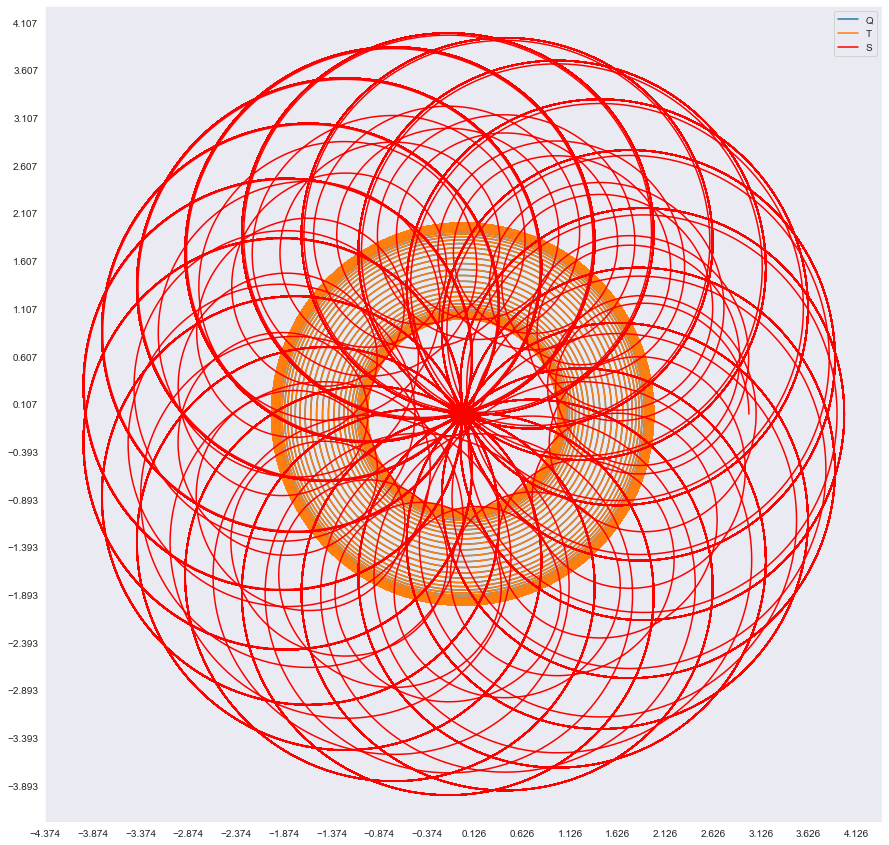

In [8]:
tmax = 3000
dt = 0.001

t = timeline(tmax, dt)

a = 0.05
x0 = 150
#rQ = -2*a/np.pi * np.arctan(2/(np.tan(2*np.pi/np.pi * t+0.0001)))
rQ = 1/(1+np.exp(-a*(t-x0))) +1
Q = phasor(t, x = 0, y = 0, r = rQ , T = 5, phase = 0)

exp = np.exp(-a*(t-x0))

rT =  a*a*exp*(1+exp)**(-2) * (-1 +2*exp*(1+exp)**(-1))
T = phasor(t, x = Q[:,0], y = Q[:,1], r = rT , T = 10, phase = 0)
S = phasor(t, x = T[:,0], y = T[:,1], r = 2 , T = 100, phase = 0)
f = 6
#Get solution
#S = solution(T[:,0],T[:,1], f, Q[:,0],Q[:,1], l2 = f, u =0)


fig, ax = plt.subplots(figsize = (15,15))
plt.axis('equal')
plt.plot(Q[:,0],Q[:,1],label='Q');
plt.plot(T[:,0],T[:,1],label='T');
plt.plot(S[:,0],S[:,1],'r-', label = "S", alpha = 1)
#plt.plot(Z[:,0],Z[:,1],'g-', label = "Z", alpha = 0.5)
plt.axis("on")
start, end = ax.get_xlim()
ax.xaxis.set_ticks(np.arange(start, end, 0.5))
start, end = ax.get_ylim()
ax.yaxis.set_ticks(np.arange(start, end, 0.5))
plt.grid()
plt.legend()
#plt.show()

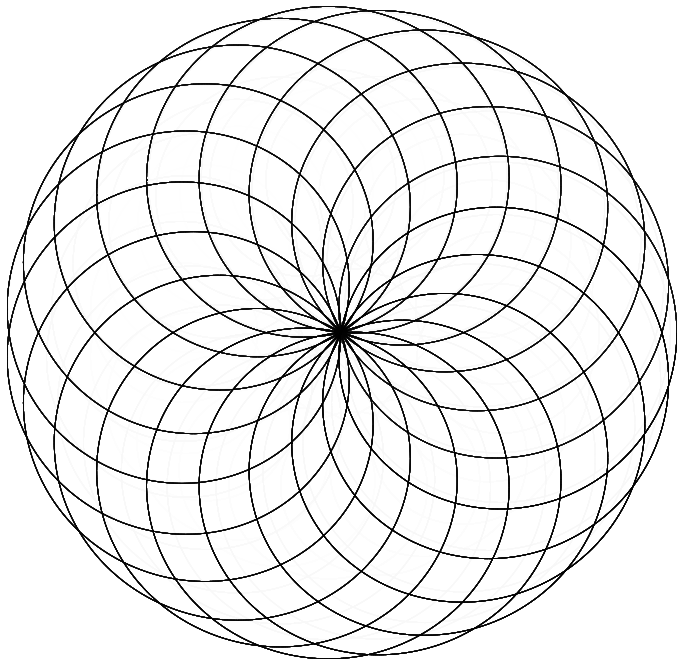

In [25]:
plot_palette(S, t, save = False, bc = "w", cmap="Greys")

line color:[0.30171079 0.51379144 0.46060977]


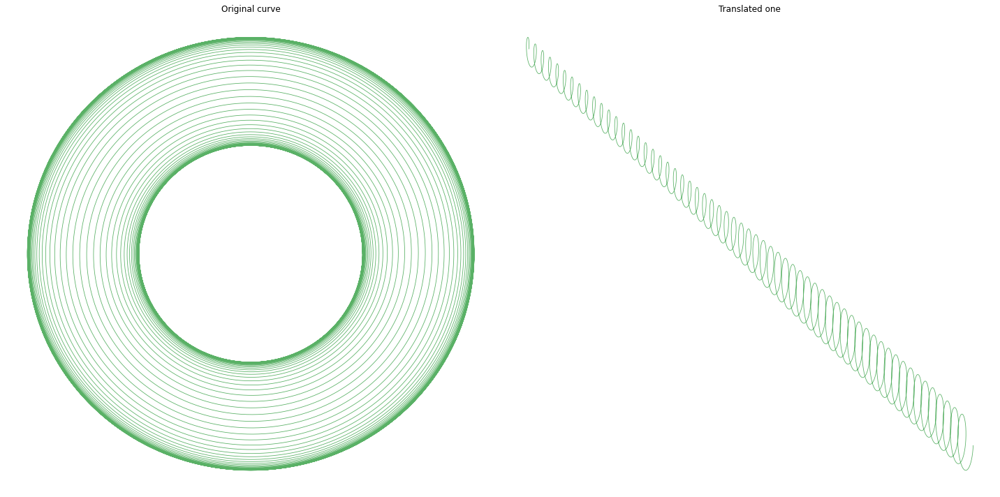

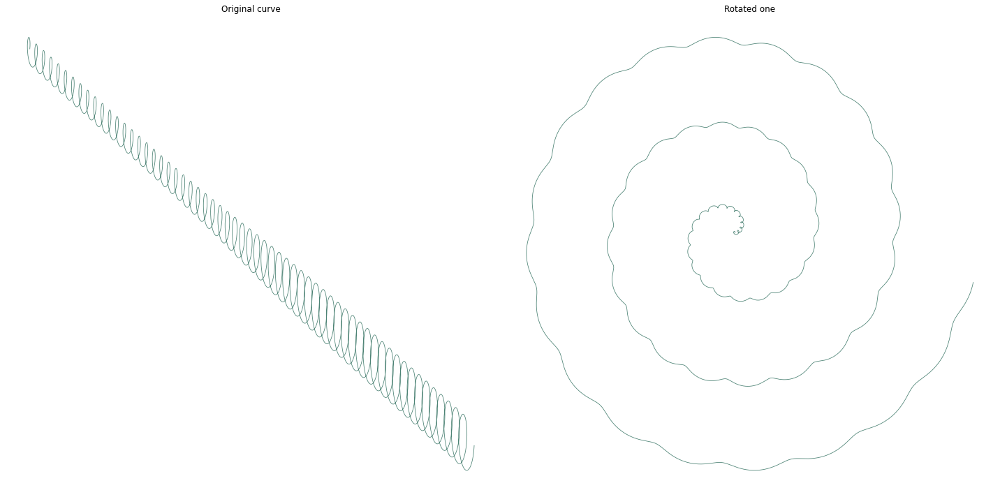

In [22]:
qx, qy = translate(T[:,0],T[:,1], t, 0.5, -0.1)
x, y = rotate(qx,qy, t, 0.01, 0.009, 100)

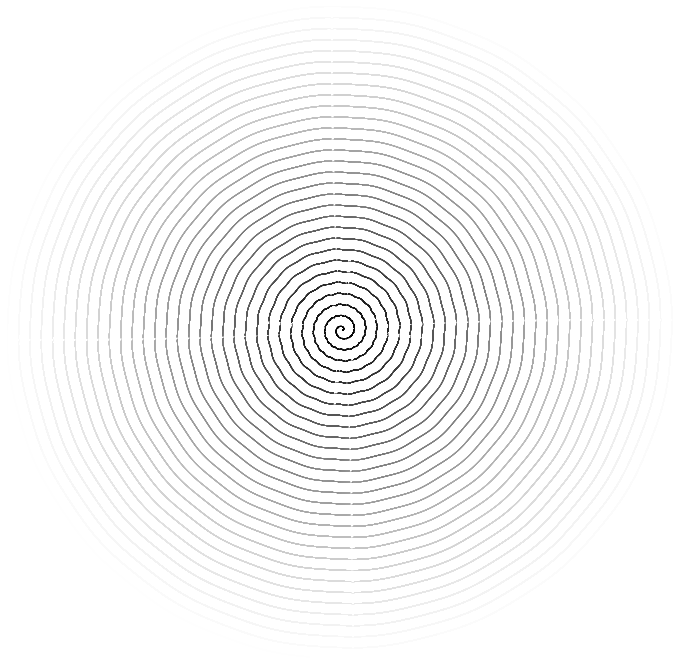

In [43]:
cmap = "Greys_r"
plot_palette(np.vstack((x,y)).T, t, save = True, bc = "w", cmap=cmap)

line color:[0.67210047 0.01036304 0.33947087]


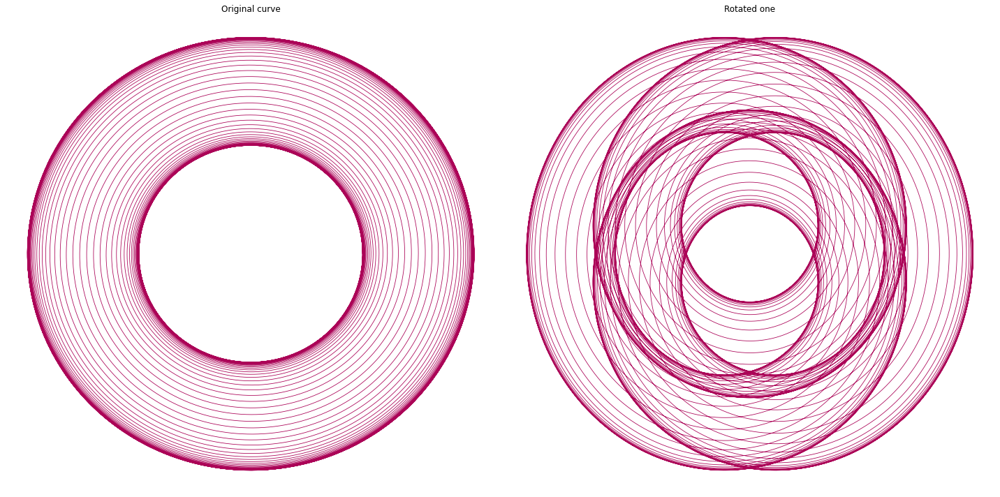

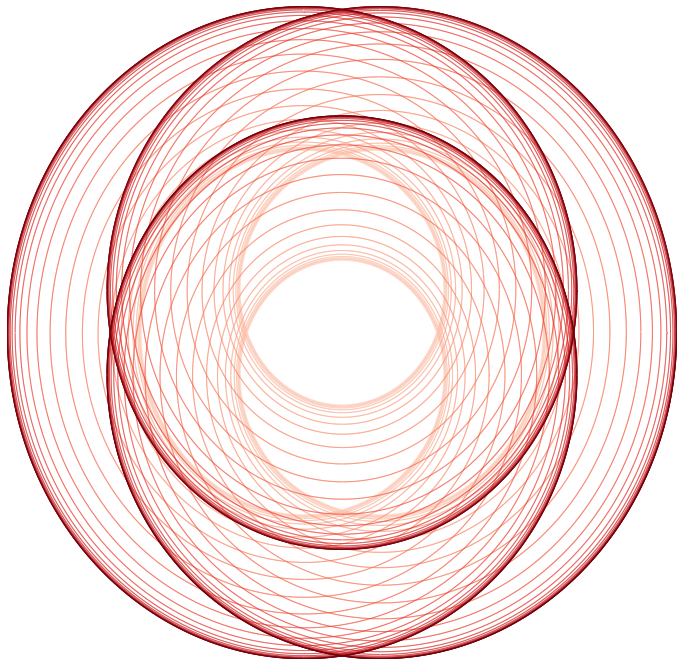

In [68]:
qx, qy = rotate(T[:,0],T[:,1], t, -0.5, 0, 10);
plot_palette(np.vstack((qx,qy)).T, t, save = False, bc = "w", cmap="Reds", lw = 1); #np.vstack((qx,qy)).T

In [ ]:
rQ = np.sqrt(t/tmax)
Q = phasor(t, qx, qy, r = 1 , T = 1, phase = 0)
plot_palette(Q, t, save = False, bc = "w", cmap="Greys")

In [ ]:
plot_palette(np.vstack((qx,qy)).T, t, save = True, bc = "w", cmap="Reds")

In [82]:
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)

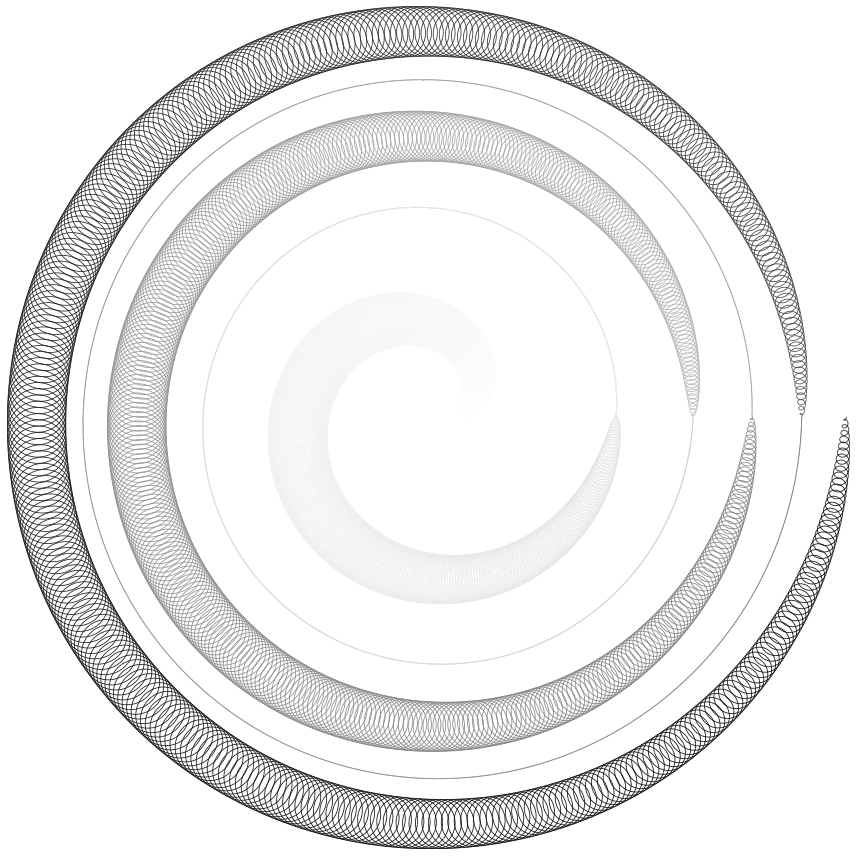

In [18]:
import matplotlib.colors
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","gray","black"]) #discrete_cmap(5, 'cool')

lw1=5 * np.sin(2*np.pi/(5*tmax))
plot_palette(P, t, save = True, bc = "w", cmap="Greys")

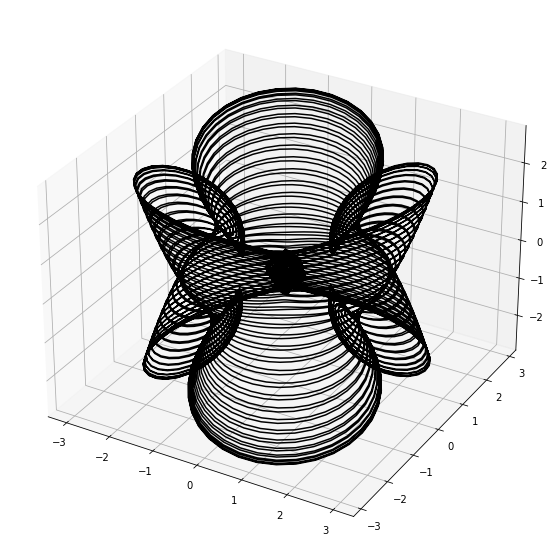

In [15]:
z1= np.sqrt(4-(5-np.sqrt(P[:,0]**2 + P[:,1]**2 )**2))*np.sin(2*np.pi/tmax *t)

fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection='3d')

plt.plot(P[:,0],P[:,1],z1,c='k')

## Video 3d

In [ ]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import matplotlib.animation as animation
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
plt.tight_layout()
# load some test data for demonstration and plot a wireframe

ax.grid(False)
ax.set_axis_off()
def init():
    ax.plot(P[:,0],P[:,1],z1)
    return fig,

def animate(i):
    ax.view_init(elev=3.6 *i-90, azim=3.6 *i)
    return fig,
# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,frames = tqdm(range(100)), interval=1, blit=True)    
anim.save('imgs/{}/animation{}.mp4'.format(today,datetime.now().strftime("%H-%M-%S")),fps = 30, dpi = 100, writer = "ffmpeg")

V2 palettato

In [ ]:
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from mpl_toolkits.mplot3d import Axes3D
points = np.array([P[:,0],P[:,1],z1]).T.reshape(-1, 1, 3)
segments = np.concatenate([points[:-1], points[1:]], axis=1)
lc = Line3DCollection(segments, cmap=plt.get_cmap('copper'))
#lc.set_array(z1) 
lc.set_linewidth(2)

#plot
ax.set_zlim(0, max(z1))
fig = plt.figure(figsize=(15,15))
ax = fig.gca(projection='3d')
ax.add_collection3d(lc, zs=z1, zdir='z')



0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

  0%|          | 0/100 [00:00<?, ?it/s]

CalledProcessError: Command '['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '1500x1500', '-pix_fmt', 'rgba', '-r', '30', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', 'animation3d.mp4']' returned non-zero exit status 255.

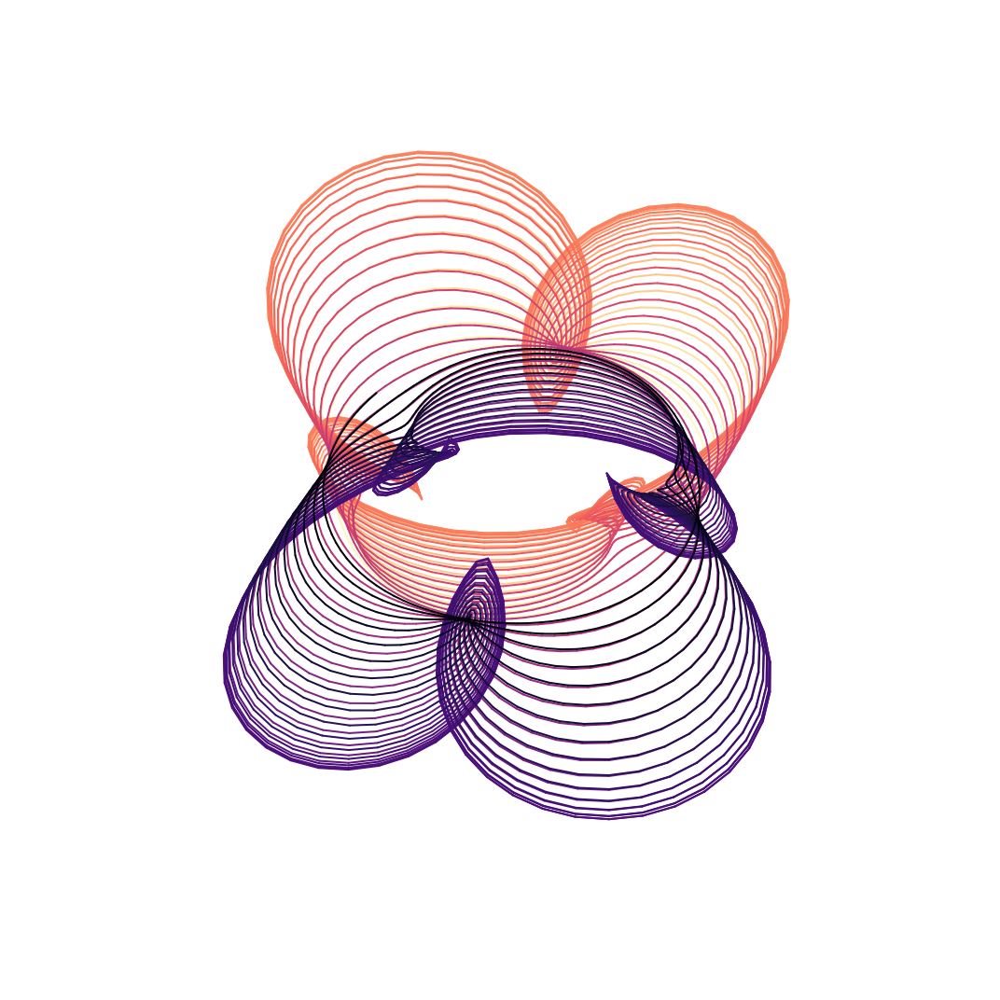

In [17]:
from mpl_toolkits.mplot3d import Axes3D

#################
### 3D Figure ###
#################
n=t.shape[0]

# Create a set of line segments
points = np.array([P[:,0],P[:,1],z1]).T.reshape(-1, 1, 3)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

cmap=plt.get_cmap('magma_r')
colors=[cmap(float(ii)/(n-1)) for ii in range(n-1)]

#plot
fig = plt.figure(figsize=(15,15))
ax = fig.gca(projection='3d')
plt.tight_layout()

ax.grid(False)
ax.set_axis_off()

for ii in range(n-1):
    print(ii)
    segii=segments[ii]
    lii, = ax.plot(segii[:,0],segii[:,1],segii[:,2],color=colors[ii],linewidth=2)
    #lii.set_dash_joinstyle('round')
    #lii.set_solid_joinstyle('round')
    lii.set_solid_capstyle('round')

#plt.title('3D-Figure')

#save plot
#plt.savefig('3D_Line.png', dpi=200, facecolor='w', edgecolor='w',orientation='portrait')


def init():
    fig
    return fig,

def animate(i):
    ax.view_init(elev=3.6*i-90, azim=3.6*i)
    return fig,
# Animate
anim = animation.FuncAnimation(fig, animate,frames = tqdm(range(100)), interval=1, blit=True)    
anim.save('animation3d.mp4',fps = 30, dpi = 100, writer = "ffmpeg")
print("done")

## Da sistemare

In [ ]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Scatter3d(
    x=nz[:,0], y=nz[:,1], z=z1,
    marker=dict(
        size=0.001,
        opacity=0.001,
    ),
    line=dict(
        width=2,
        color=z1,
        colorscale='magma_r',
    )
))

fig.update_layout(
    width=800,
    height=800,
    autosize=False,
    scene=dict(
        camera=dict(
            up=dict(
                x=0,
                y=0,
                z=1
            ),
            eye=dict(
                x=0,
                y=1.0707,
                z=1,
            )
        ),
        aspectratio = dict( x=1, y=1, z=1 ),
        aspectmode = 'manual'
    ,
    xaxis = dict(backgroundcolor="rgb(0, 0,0)",
                         showgrid=False,
                         showbackground=False,
                         showticklabels=False,
                         title='',
                         ),
    yaxis = dict(backgroundcolor="rgb(0, 0,0)",
                         showgrid=False,
                         showbackground=False,
                         showticklabels=False,
                         title='',
                         ),
    zaxis = dict(backgroundcolor="rgb(0, 0,0)",
                         showgrid=False,
                         showbackground=False,
                         showticklabels=False,
                         title=''
                         )),
)


fig.show()

In [ ]:
def make_video():
    x_rot = 2
    y_rot = 3
    Tfoglio = 42
    n = tmax/dt
    fig = plt.figure(figsize=(10, 10))
    ax = plt.axes() 
    #plt.axis('off')
    #c1=np.random.rand(3,)
    line, = ax.plot([], [], lw = 0.8, c = "k")
    line2, = ax.plot([], [], marker = ".", color = "b", lw = 0.8)
    line3, = ax.plot([], [], color = "tomato", linestyle = "-", lw = 0.8, alpha = 0.7)# np.exp(-time/250))
    line4, = ax.plot(x_rot, y_rot, color = "k", marker = "*", lw = 0.5, alpha = 0.6)
    plt.xlim(x_rot - 10, x_rot + 10) 
    plt.ylim(y_rot - 10, y_rot + 10) 
    plt.tight_layout()
    plt.close()

def init():
    line.set_data([], [])
    line2.set_data([], [])
    line3.set_data([], [])
    return line,

def animate(i):
    if i%(np.floor(5000/(60*15)))==0:
        omega=-2*np.pi/Tfoglio
        qx = []
        qy = []
        for j in range(i):
            qx.append(x_rot + np.cos(omega * t[1] * (i-j)) * (z[j,0] - x_rot) - np.sin(omega*t[1]*(i-j)) * (z[j,1] - y_rot))
            qy.append(y_rot + np.sin(omega * t[1] * (i-j)) * (z[j,0] - x_rot) + np.cos(omega*t[1]*(i-j)) * (z[j,1] - y_rot))
        line.set_data(qx, qy)
        line2.set_data(z[i,0],z[i,1])
        line3.set_data(z[:i,0],z[:i,1])
    return line,

anim = animation.FuncAnimation(fig, animate, init_func=init,frames = tqdm(range(5000)), interval=1, blit=False)
anim.save('animation.mp4',fps = 60, dpi = 50, writer = "ffmpeg")

## Mobius

In [59]:
import plotly.graph_objects as go

s = 2*np.linspace(0.0, 2 * np.pi, 100)[None, :]
t = np.linspace(-1.0, 1.0, 100)[:, None]

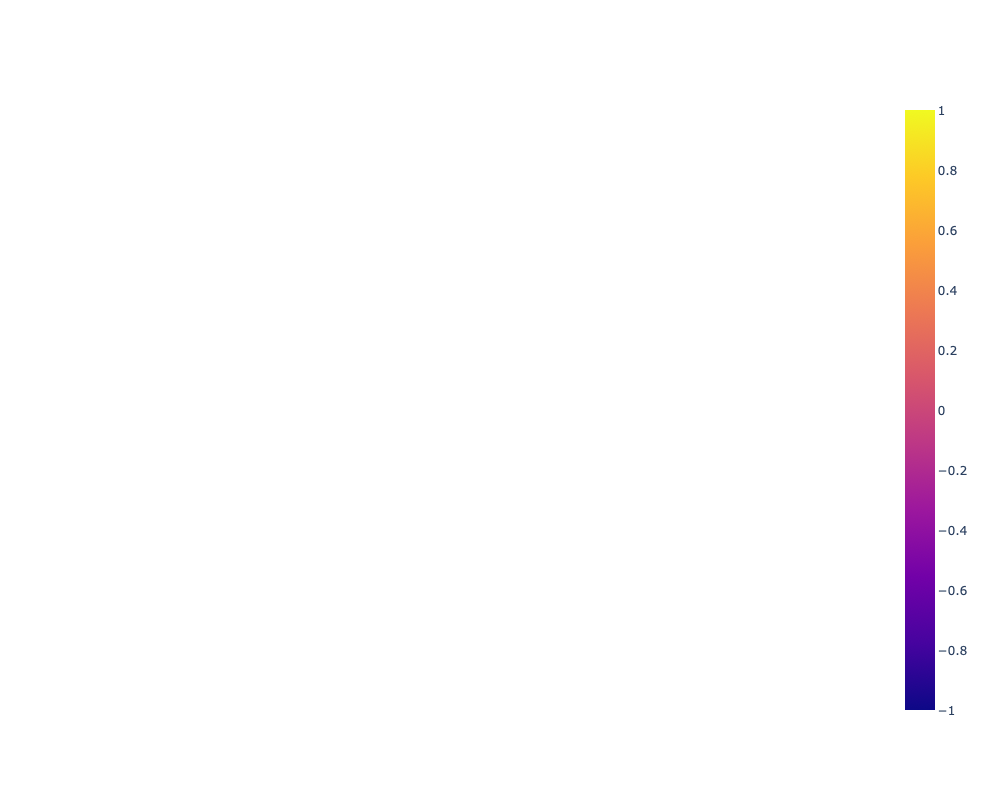

In [62]:
x = (1 + 0.5 * t * 0.5*np.cos(0.5 * s)) * np.cos(s)
y = (1 + 0.5 * t * 0.5*np.cos(0.5 * s)) * np.sin(s) #* np.floor(s)
z = 0.5 * t * np.sin(0.5 * s)

fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout(autosize=False,
                  width=800, height=800)
fig.show()

  0%|          | 0/100 [00:00<?, ?it/s]

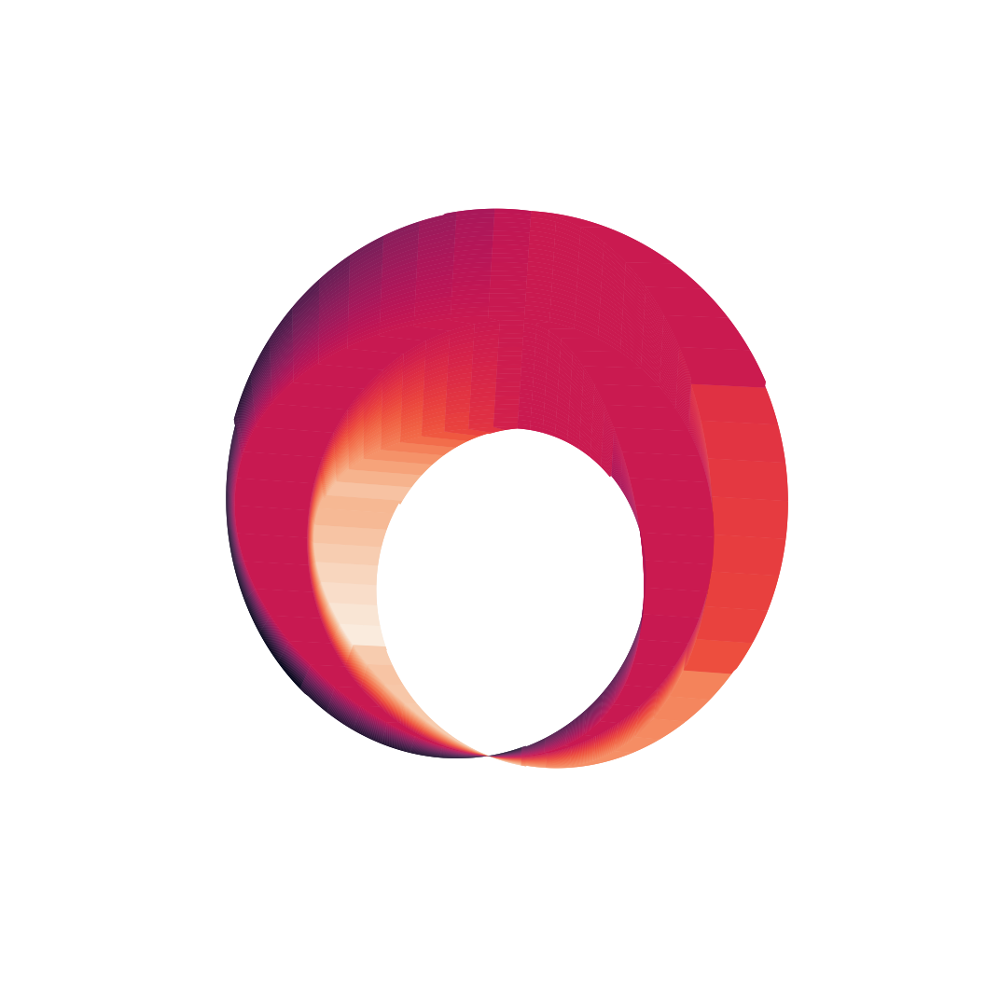

In [43]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
import matplotlib.animation as animation
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
plt.tight_layout()
# load some test data for demonstration and plot a wireframe

ax.grid(False)
ax.set_axis_off()
def init():
    ax.plot_surface(x,y,z, antialiased=True, cmap="rocket")
    return fig,

def animate(i):
    ax.view_init(elev=3.6 *i-90, azim=3.6 *i)
    return fig,
# Animate
anim = animation.FuncAnimation(fig, animate, init_func=init,frames = tqdm(range(100)), interval=1, blit=True)    
anim.save('animation5.mp4',fps = 30, dpi = 100, writer = "ffmpeg")